In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scipy.io
from sklearn.metrics import confusion_matrix
import anndata as ad
import re
from datetime import datetime
import os

from scepia.sc import (
    infer_motifs, 
    plot
)  

%matplotlib inline

sc.settings.verbosity = 3
sc.logging.print_versions()
sc.set_figure_params(dpi=150)

work_dir = "path_to_files/Py_analysis/" 
dataset_path = "path_to_files/R_analysis/20210712_PythonTransfer_SCEPIA_PC30_res1.6/"
result_descript = "_SCEPIA_H3K27Ac_Human_threeClusters/"

-----
anndata     0.7.6
scanpy      1.8.1
sinfo       0.3.1
-----
Bio                 1.79
HTSeq               0.13.5
PIL                 8.3.1
adjustText          NA
anndata             0.7.6
appdirs             1.4.4
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
boltons             NA
brotli              NA
bucketcache         0.12.1
certifi             2021.05.30
cffi                1.14.6
chardet             4.0.0
colorama            0.4.4
concurrent          NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.3.0
decorator           4.4.2
defusedxml          0.7.1
diskcache           5.2.1
encodings           NA
fbpca               NA
fluff               NA
genericpath         NA
genomepy            0.9.3
geosketch           1.2
gimmemotifs         0.16.1
h5py                3.3.0
idna                2.10
igraph              0.9.6
ipykernel           6.0.1
ipython_genutils    0.2.0
ipywidgets          7.6.3

In [2]:
today = datetime.now()
work_dir = work_dir + "/" + today.strftime('%Y%m%d') + result_descript + "/"
os.mkdir(work_dir)

#### Data locations & Other parameters

In [3]:
## Data locations ##
raw_spliced_path = dataset_path + "seurat_sf_counts.mtx"
raw_unspliced_path = dataset_path + "seurat_uf_counts.mtx"
scaled_spliced_path = dataset_path + "seurat_sf_scaled_counts.csv"
scaled_unspliced_path = dataset_path + "seurat_uf_scaled_counts.csv"

## Loading Metadata from another location for merging of clusters
metadata_path = "path_to_files/R_analysis/20210913_ClusterMerging/seurat_metadata.csv"
featuredata_path = dataset_path + "seurat_HVG.csv"
umap_path = dataset_path + "seurat_umap_embedding.csv"

## Parameters to set ##
pc_set = 30

#### Loading data

In [4]:
raw_spliced = scipy.io.mmread(raw_spliced_path)
raw_unspliced = scipy.io.mmread(raw_unspliced_path)
scaled_spliced = np.asmatrix(pd.read_csv(scaled_spliced_path, index_col = 0))
scaled_unspliced = np.asmatrix(pd.read_csv(scaled_unspliced_path, index_col = 0))
metadata = pd.read_csv(metadata_path, index_col = 0)
featuredata = pd.read_csv(featuredata_path, index_col = 0)
umap_embedding = np.asmatrix(pd.read_csv(umap_path, index_col = 0))

In [5]:
## Building the adata object, matrices from Seurat need Transposing before adding.
adata = ad.AnnData(X = scaled_spliced.T,
                   obs = metadata,
                   var = featuredata
                  )
adata.layers["spliced"] = scaled_spliced.T
adata.layers["unspliced"] = scaled_unspliced.T
adata.obsm["X_umap"] = umap_embedding

In [6]:
adata.var['highly_variable'] = adata.var['vst.variable']
adata.var['dispersions_norm'] = adata.var['vst.variance.standardized']
adata.obs['louvain'] = adata.obs['three_clusters']
adata

AnnData object with n_obs × n_vars = 6636 × 21099
    obs: 'orig.ident', 'nCount_sf', 'nFeature_sf', 'Experiment', 'Replicate', 'Index', 'Flowcell', 'Well', 'combined_id', 'Adapter', 'Plate', 'Library.day', 'Bio.Size', 'Concentration', 'Timepoint', 'SubmissionName', 'Libnumber', 'is_cell_control', 'total_features_by_counts', 'log10_total_features_by_counts', 'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features', 'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features', 'pct_counts_in_top_500_features', 'total_features_by_counts_endogenous', 'log10_total_features_by_counts_endogenous', 'total_counts_endogenous', 'log10_total_counts_endogenous', 'pct_counts_endogenous', 'pct_counts_in_top_50_features_endogenous', 'pct_counts_in_top_100_features_endogenous', 'pct_counts_in_top_200_features_endogenous', 'pct_counts_in_top_500_features_endogenous', 'total_features_by_counts_feature_control', 'log10_total_features_by_counts_feature_control', 'total_counts_feature_co

In [7]:
scaled_spliced[1:10,1:10]

matrix([[-2.58352989e-01, -3.43765477e-01, -3.19193578e-01,
         -3.70052028e-01, -3.55753097e-01, -4.00458918e-01,
         -3.92731167e-01, -1.78643797e-01,  2.97539485e+00],
        [-2.99816393e-01, -3.30335964e-01, -3.23208388e-01,
         -3.40782277e-01, -3.39242203e-01, -3.50275507e-01,
         -3.09318017e-01, -2.66937675e-01, -3.41038600e-01],
        [-6.69455768e-02, -5.52921098e-02,  1.00000000e+01,
         -5.26208093e-02, -5.76719638e-02, -4.72806557e-02,
         -1.51575397e-02, -7.40015976e-02, -5.25626938e-02],
        [-8.29870091e-02, -1.26720833e-01, -1.11087109e-01,
         -1.38234290e-01, -1.24320281e-01, -1.56337248e-01,
         -2.22930663e-01, -5.02950078e-02, -1.38497306e-01],
        [-2.73733370e-01, -4.46668323e-01, -3.92841216e-01,
         -4.97291727e-01, -4.59536011e-01, -5.62240531e-01,
         -6.40817394e-01, -1.23192630e-01, -4.98485552e-01],
        [-4.86567411e-01,  1.21800396e+00,  2.47071453e+00,
         -8.36891464e-01, -7.743899

In [8]:
adata.obs = adata.obs.astype(str)
#adata.var_names_make_unique()

In [9]:
adata.raw = adata

#### Select the HVG & run neighbors
In `adata.var['vst.variable']` the HVG are stored from Seurat Analysis

In [10]:
# Filter adata on HVG
adata = adata[:, adata.var['highly_variable']]

In [11]:
# SCEPIA: louvain clustering, n_neighbors in Seurat = 20
sc.pp.neighbors(adata, n_neighbors = 20, n_pcs= pc_set)
#sc.tl.louvain(adata)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


... storing 'orig.ident' as categorical
... storing 'nCount_sf' as categorical
... storing 'nFeature_sf' as categorical
... storing 'Experiment' as categorical
... storing 'Replicate' as categorical
... storing 'Index' as categorical
... storing 'Flowcell' as categorical
... storing 'Well' as categorical
... storing 'combined_id' as categorical
... storing 'Adapter' as categorical
... storing 'Plate' as categorical
... storing 'Library.day' as categorical
... storing 'Bio.Size' as categorical
... storing 'Concentration' as categorical
... storing 'Timepoint' as categorical
... storing 'SubmissionName' as categorical
... storing 'Libnumber' as categorical
... storing 'is_cell_control' as categorical
... storing 'total_features_by_counts' as categorical
... storing 'log10_total_features_by_counts' as categorical
... storing 'total_counts' as categorical
... storing 'log10_total_counts' as categorical
... storing 'pct_counts_in_top_50_features' as categorical
... storing 'pct_counts_in_to

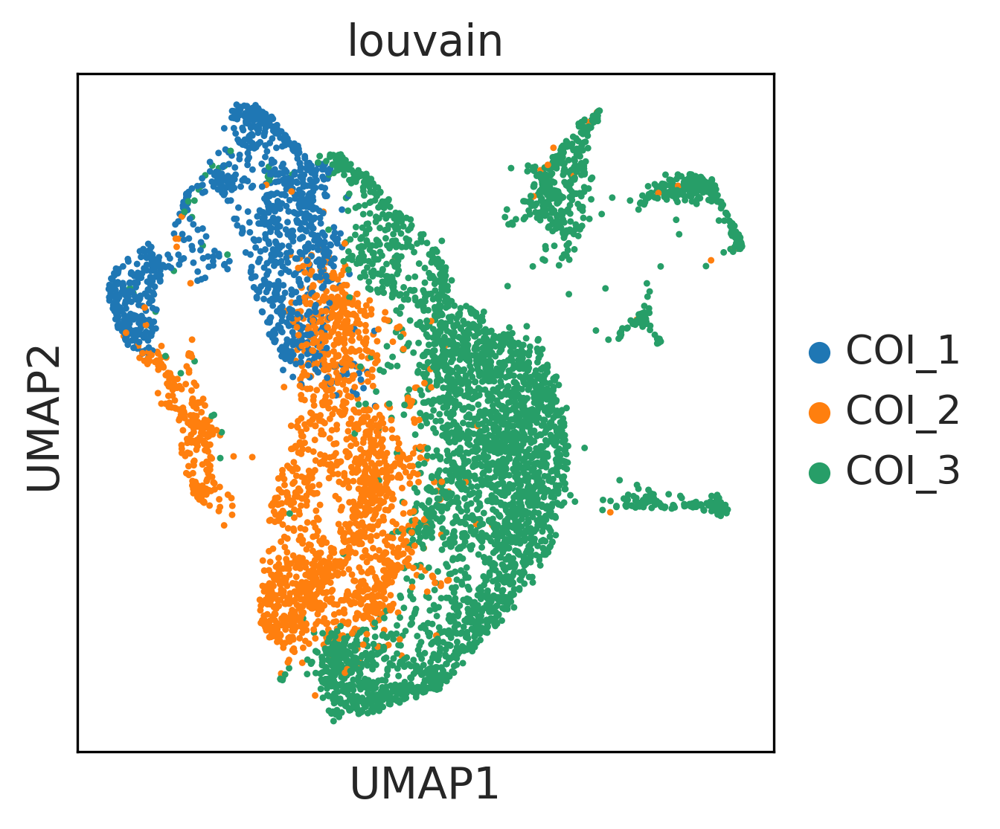

In [12]:
sc.pl.umap(adata, color = 'louvain')

#### Rename clusters

In [13]:
# new_cluster_names = ['']
# adata.rename_categories('louvain', new_cluster_names)
#adata.obs['cluster_annotation'] = adata.obs['louvain']

In [14]:
adata.obs['Timepoint'] = pd.Categorical(adata.obs['Timepoint'], categories = ["D0" ,"D1","D2","D3","D4","D5","D6","D7","D8","D9"], ordered = True)

In [15]:
adata.obs['Timepoint'].unique()

['D7', 'D6', 'D9', 'D8', 'D5', 'D4', 'D3', 'D2', 'D0', 'D1']
Categories (10, object): ['D0' < 'D1' < 'D2' < 'D3' ... 'D6' < 'D7' < 'D8' < 'D9']

In [16]:
adata.var['dispersions_norm'].head()

Aox1       1.255031
Rgs20      1.212775
Cacna1e    1.580562
Pax3       1.273136
Cd247      1.545826
Name: dispersions_norm, dtype: float64

In [17]:
adata.var.head()

,vst.variance.standardized,vst.variable,highly_variable,dispersions_norm
Aox1,1.255031,True,True,1.255031
Rgs20,1.212775,True,True,1.212775
Cacna1e,1.580562,True,True,1.580562
Pax3,1.273136,True,True,1.273136
Cd247,1.545826,True,True,1.545826


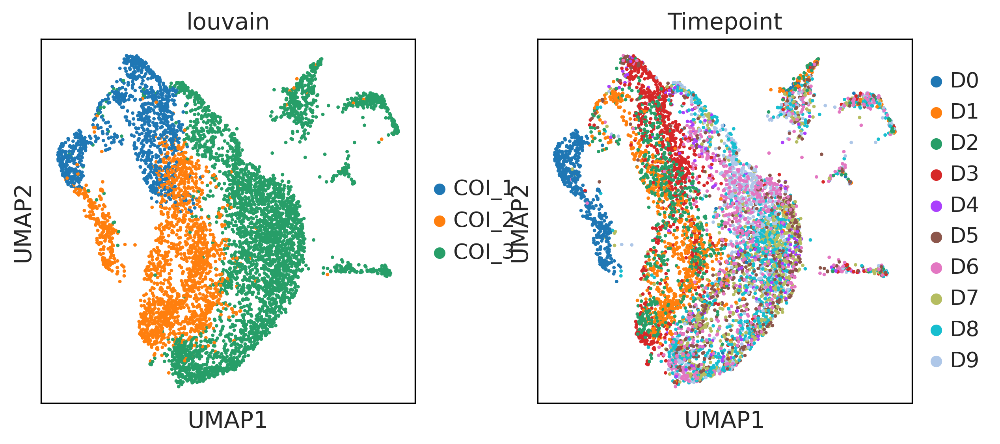

In [18]:
sc.pl.umap(adata, color = ['louvain','Timepoint'])

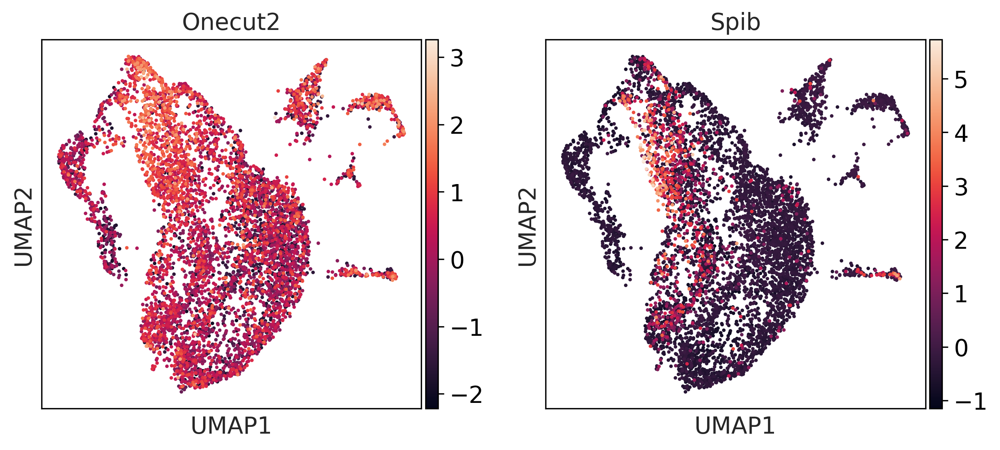

In [19]:
sc.pl.umap(adata, color = ['Onecut2','Spib'])

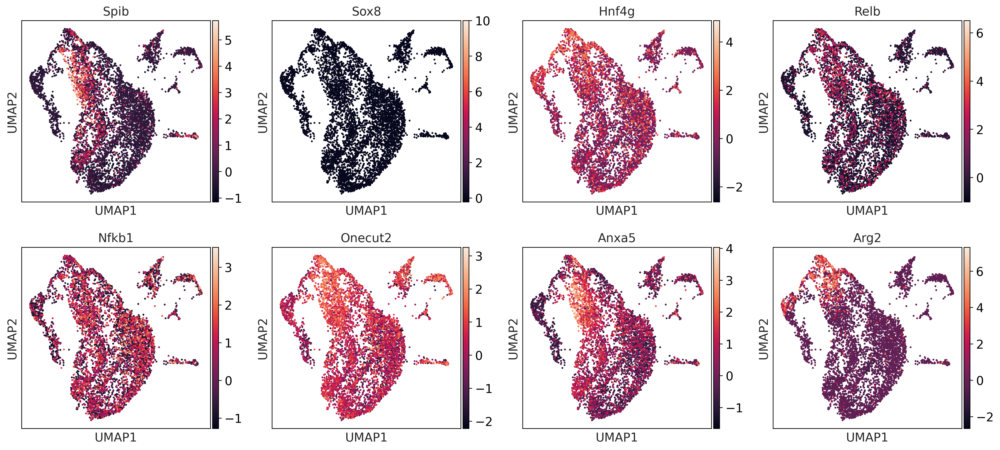

In [20]:
sc.pl.umap(adata, color = ['Spib', 'Sox8', 'Hnf4g', 'Relb', 'Nfkb1', 'Onecut2', 'Anxa5', 'Arg2'])

In [21]:
# ## Load genome
# import genomepy
# genomepy.install_genome("hg38")

In [22]:
infer_motifs(adata, dataset="ENCODE.H3K27ac.human", n_top_genes=2000, min_annotated = 1)

2021-12-20 17:15:26 - INFO - Loading reference data (gene).
2021-12-20 17:15:27 - INFO - Selecting reference cell types
2021-12-20 17:15:27 - INFO - Using 1405 hypervariable common genes
2021-12-20 17:15:28 - INFO - 50 out of 121 selected
2021-12-20 17:15:28 - INFO - Top 5:
2021-12-20 17:15:28 - INFO -  * thymus
2021-12-20 17:15:28 - INFO -  * myotube
2021-12-20 17:15:28 - INFO -  * HEK293
2021-12-20 17:15:28 - INFO -  * skeletal muscle myoblast
2021-12-20 17:15:28 - INFO -  * small intestine
2021-12-20 17:15:28 - INFO - Annotating cells.


  0%|          | 0/6636 [00:00<?, ?it/s]

2021-12-20 17:16:29 - INFO - Linking variable genes to differential enhancers.
2021-12-20 17:16:38 - INFO - Loading reference data (enhancer).
2021-12-20 17:17:08 - INFO - inferring motif activity
2021-12-20 17:17:08 - INFO - Activity based on genome hg38
2021-12-20 17:17:12,962 - INFO - motif scanning (scores)
2021-12-20 17:17:12,965 - INFO - reading table
2021-12-20 17:17:21,234 - INFO - creating score table (z-score, GC%)
2021-12-20 17:18:51,515 - INFO - done
2021-12-20 17:18:53,806 - INFO - creating dataframe
2021-12-20 17:18:57,285 - INFO - Fitting BayesianRidge


  0%|          | 0/50 [00:00<?, ?it/s]

2021-12-20 17:21:58,067 - INFO - Done
2021-12-20 17:21:58 - INFO - calculating cell-specific motif activity
2021-12-20 17:21:58 - INFO - correlating motif activity with factors
2021-12-20 17:21:58 - INFO - including indirect and/or predicted factors
2021-12-20 17:22:00 - INFO - creating sketch of 2500 cells
2021-12-20 17:22:05 - INFO - calculating correlation of motif activity with 609 factors
2021-12-20 17:22:09 - INFO - calculating 100000 permutations


  0%|          | 0/60 [00:00<?, ?it/s]

2021-12-20 17:32:25 - INFO - calculating permutation-based p-values (all)
2021-12-20 17:36:17 - INFO - calculating permutation-based p-values (factor-specific)


  0%|          | 0/3299 [00:00<?, ?it/s]

2021-12-20 17:36:22 - INFO - Inferring factor activity.


  0%|          | 0/609 [00:00<?, ?it/s]

2021-12-20 17:37:56 - INFO - Done with motif inference.


... storing 'cluster_annotation' as categorical
... storing 'cell_annotation' as categorical


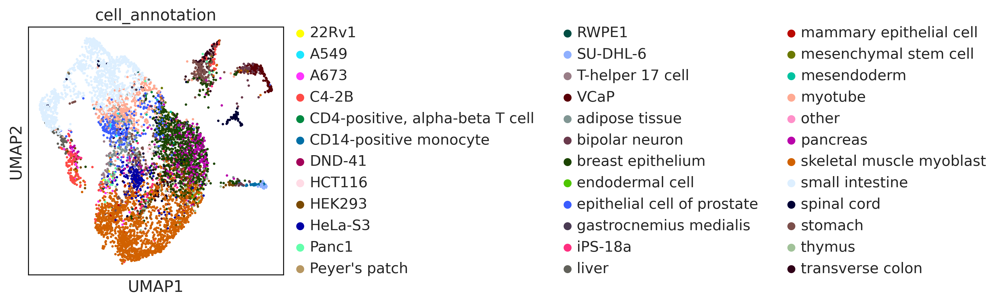

In [23]:
sc.pl.umap(adata, color="cell_annotation")

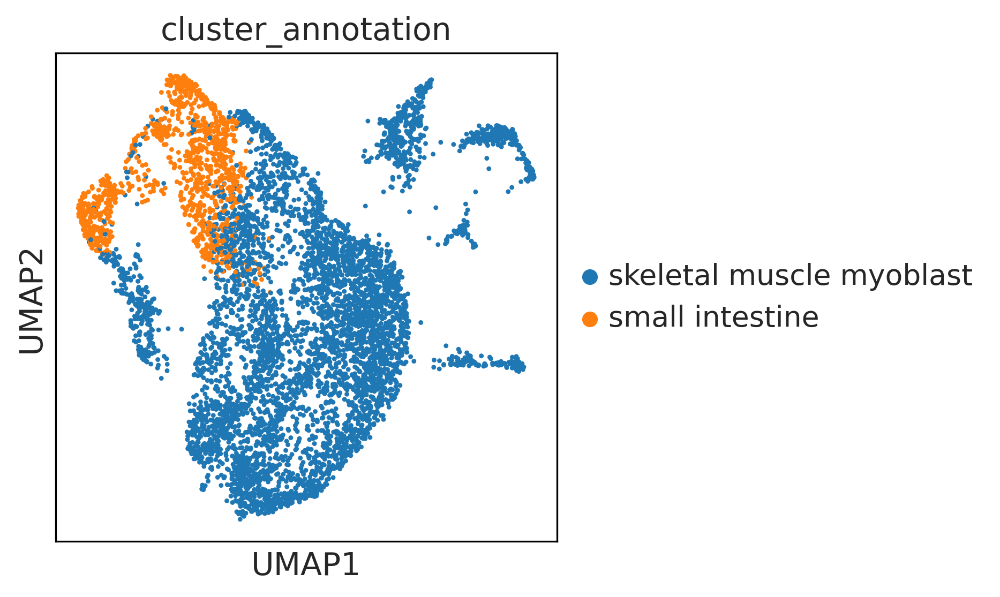

In [24]:
sc.pl.umap(adata, color="cluster_annotation")

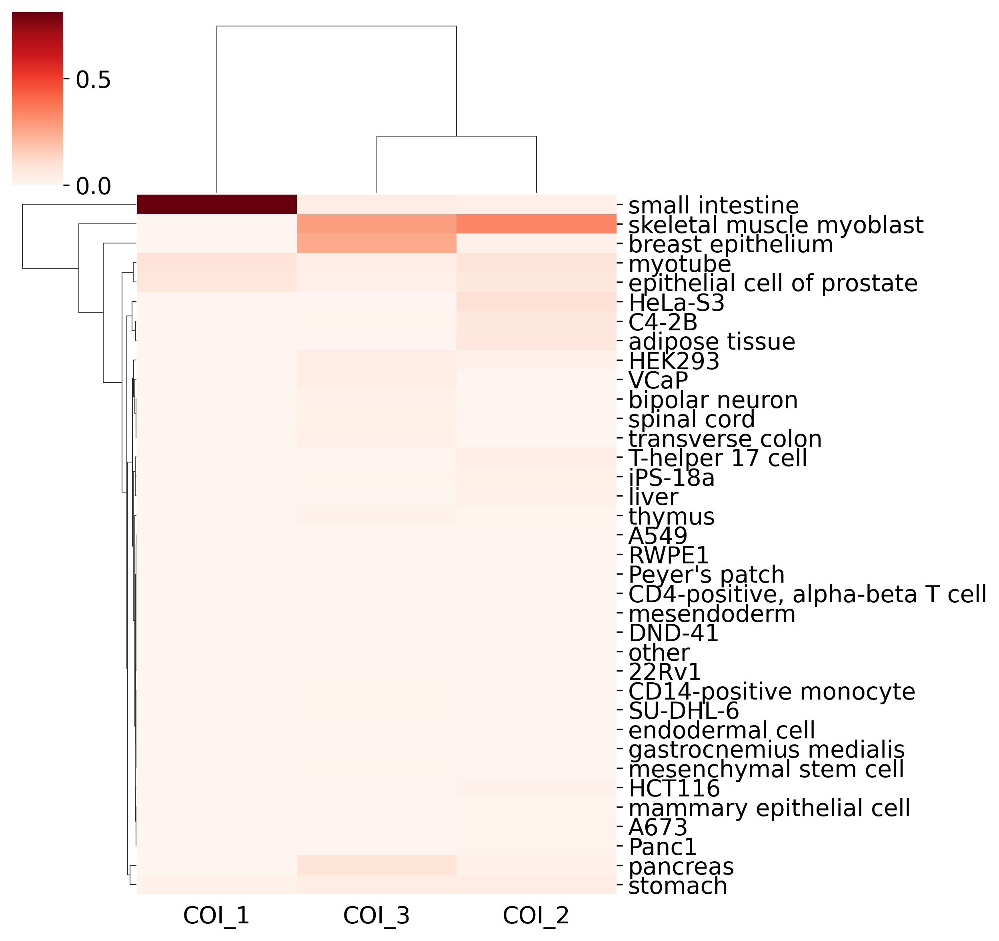

In [25]:
labels = list(set(np.hstack((adata.obs["louvain"].astype(str).unique(), adata.obs["cell_annotation"].astype(str).unique()))))

cnf_matrix = pd.DataFrame(confusion_matrix(adata.obs["louvain"], adata.obs["cell_annotation"], labels=labels), index=labels, columns=labels)
cnf_matrix = cnf_matrix.loc[adata.obs["louvain"].astype(str).unique(), adata.obs["cell_annotation"].astype(str).unique()]
cnf_matrix = cnf_matrix.div(cnf_matrix.sum(1), axis=0)
cm = sns.clustermap(cnf_matrix.T, cmap="Reds", figsize=(8.5,8), yticklabels=True)

In [26]:
adata.uns["scepia"].keys()

dict_keys(['version', 'cell_types', 'pfm', 'motif_activity', 'correlation'])

In [27]:
adata.uns["scepia"]["correlation"].sort_values("p_adj").head(10)

,motif,correlation,abs_correlation,pval,permutation_pval,combined,p_adj,-log10(p-value),motif_stddev
factor,,,,,,,,,
CREB3L3,GM.5.0.bZIP.0041,-0.763459,0.763459,0.000033,0.020049,0.000010,0.010366,1.984368,0.002632
HNF4G,GM.5.0.Nuclear_receptor.0068,0.436634,0.436634,0.000836,0.000779,0.000010,0.010366,1.984368,0.007962
HNF4G,GM.5.0.Nuclear_receptor.0096,0.434906,0.434906,0.000853,0.001519,0.000019,0.010366,1.984368,0.033741
SP8,GM.5.0.C2H2_ZF.0174,-0.109397,0.109397,0.068037,0.000010,0.000010,0.010366,1.984368,0.009158
HNF4G,GM.5.0.Nuclear_receptor.0056,0.435404,0.435404,0.000848,0.001302,0.000016,0.010366,1.984368,0.039067
HNF4G,GM.5.0.Mixed.0003,0.435345,0.435345,0.000849,0.001331,0.000017,0.010366,1.984368,0.007087
ARX,GM.5.0.Homeodomain.0087,0.278578,0.278578,0.006328,0.000256,0.000023,0.010960,1.960206,0.001909
ZEB1,GM.5.0.C2H2_ZF_Homeodomain.0002,-0.197299,0.197299,0.019524,0.000128,0.000035,0.014345,1.843284,0.025018
HNF4G,GM.5.0.Nuclear_receptor.0028,0.432075,0.432075,0.000882,0.003393,0.000041,0.015040,1.822738,0.029080


In [28]:
corr_table = adata.uns["scepia"]["correlation"].sort_values("p_adj")
corr_table.to_csv(work_dir + "SCEPIA_corr_table.csv")

In [29]:
## Keep tf-motif combination with highest correlation
corr_table[~corr_table.index.duplicated(keep='first')].head(60)

,motif,correlation,abs_correlation,pval,permutation_pval,combined,p_adj,-log10(p-value),motif_stddev
factor,,,,,,,,,
CREB3L3,GM.5.0.bZIP.0041,-0.763459,0.763459,0.000033,0.020049,0.000010,0.010366,1.984368,0.002632
HNF4G,GM.5.0.Nuclear_receptor.0068,0.436634,0.436634,0.000836,0.000779,0.000010,0.010366,1.984368,0.007962
SP8,GM.5.0.C2H2_ZF.0174,-0.109397,0.109397,0.068037,0.000010,0.000010,0.010366,1.984368,0.009158
ARX,GM.5.0.Homeodomain.0087,0.278578,0.278578,0.006328,0.000256,0.000023,0.010960,1.960206,0.001909
ZEB1,GM.5.0.C2H2_ZF_Homeodomain.0002,-0.197299,0.197299,0.019524,0.000128,0.000035,0.014345,1.843284,0.025018
SMARCC2,GM.5.0.bZIP.0019,-0.153926,0.153926,0.035604,0.000118,0.000056,0.018595,1.730612,0.006495
SOX4,GM.5.0.Sox.0003,-0.507860,0.507860,0.000485,0.017525,0.000108,0.021908,1.659392,0.011802
PAX4,GM.5.0.Homeodomain.0014,0.436302,0.436302,0.000839,0.010306,0.000109,0.021908,1.659392,0.004088
KLF6,GM.5.0.C2H2_ZF.0006,0.239912,0.239912,0.010867,0.000562,0.000079,0.021908,1.659392,0.000892


In [30]:
corr_table[~corr_table.index.duplicated(keep='first')][60:100]

,motif,correlation,abs_correlation,pval,permutation_pval,combined,p_adj,-log10(p-value),motif_stddev
factor,,,,,,,,,
HNF4A,GM.5.0.Nuclear_receptor.0133,0.230404,0.230404,0.012389,0.017574,0.002054,0.059428,1.226011,0.003755
ZBTB7B,GM.5.0.C2H2_ZF.0058,-0.209530,0.209530,0.016484,0.014566,0.002241,0.062660,1.203006,0.011607
POU2F2,GM.5.0.Mixed.0096,-0.090402,0.090402,0.091064,0.002949,0.002476,0.066966,1.174144,0.005642
CEBPA,GM.5.0.bZIP.0052,0.209389,0.209389,0.016551,0.017574,0.002659,0.071326,1.146751,0.008274
MLX,GM.5.0.bHLH.0041,-0.186528,0.186528,0.022653,0.014586,0.002979,0.072268,1.141055,0.012961
PBX1,GM.5.0.Homeodomain.0027,-0.283681,0.283681,0.005859,0.052140,0.002778,0.072268,1.141055,0.003277
TCF12,GM.5.0.bHLH.0022,0.152351,0.152351,0.036441,0.008205,0.002725,0.072268,1.141055,0.004251
HES2,GM.5.0.bHLH.0095,-0.109235,0.109235,0.068200,0.004763,0.002934,0.072268,1.141055,0.005108
FOXQ1,GM.5.0.Forkhead.0036,-0.146496,0.146496,0.039558,0.008087,0.002894,0.072268,1.141055,0.000593


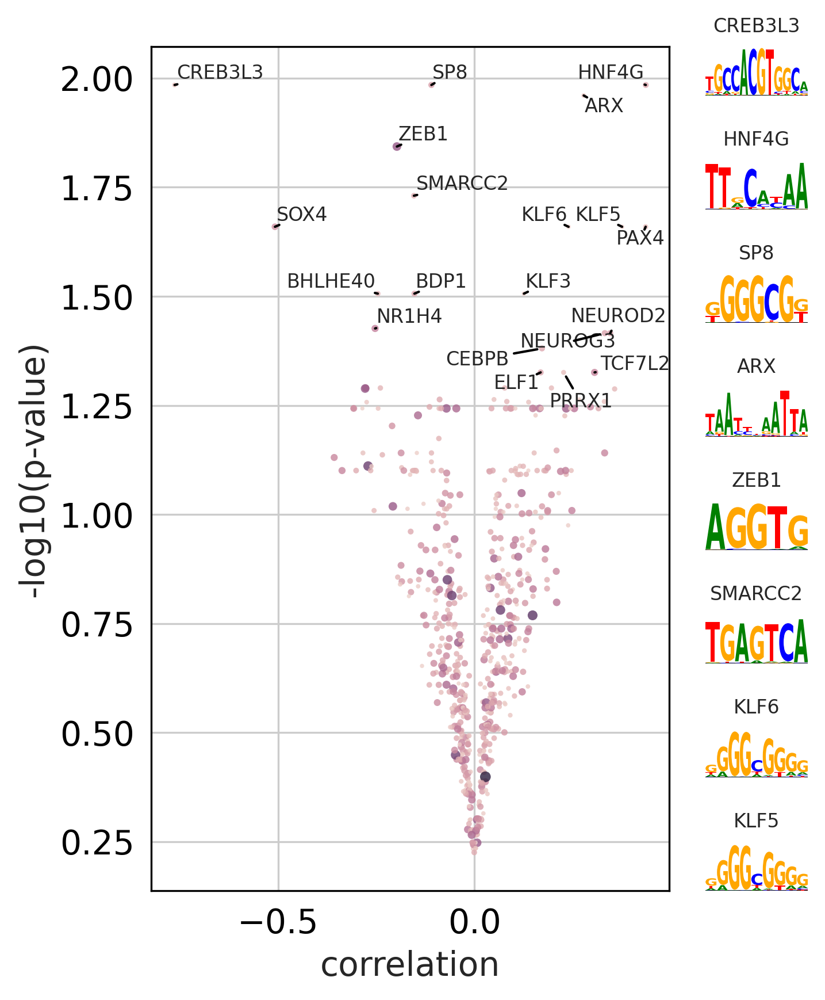

In [31]:
ax = plot(adata, n_anno=50, max_pval = 0.05)

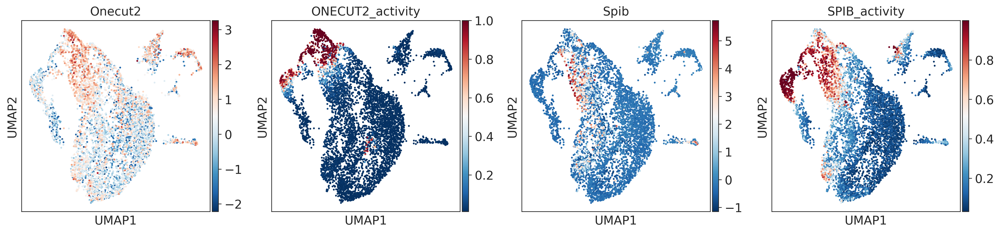

In [32]:
sc.pl.umap(adata, color=["Onecut2", "ONECUT2_activity", "Spib", "SPIB_activity"], cmap="RdBu_r")

In [33]:
f2m = adata.uns["scepia"]['correlation']
f2m.loc["ONECUT2"].sort_values("p_adj").head(10)

,motif,correlation,abs_correlation,pval,permutation_pval,combined,p_adj,-log10(p-value),motif_stddev
factor,,,,,,,,,
ONECUT2,GM.5.0.CUT_Homeodomain.0005,0.330889,0.330889,0.003217,0.028738,0.000951,0.055096,1.258879,0.003497
ONECUT2,GM.5.0.CUT_Homeodomain.0001,0.294740,0.294740,0.005070,0.084625,0.003756,0.078103,1.107330,0.003595
ONECUT2,GM.5.0.CUT_Homeodomain.0002,0.259600,0.259600,0.008249,0.157377,0.009927,0.101571,0.993229,0.014155
ONECUT2,GM.5.0.CUT_Homeodomain.0010,-0.039782,0.039782,0.221671,0.460759,0.335156,0.446198,0.350472,0.013074


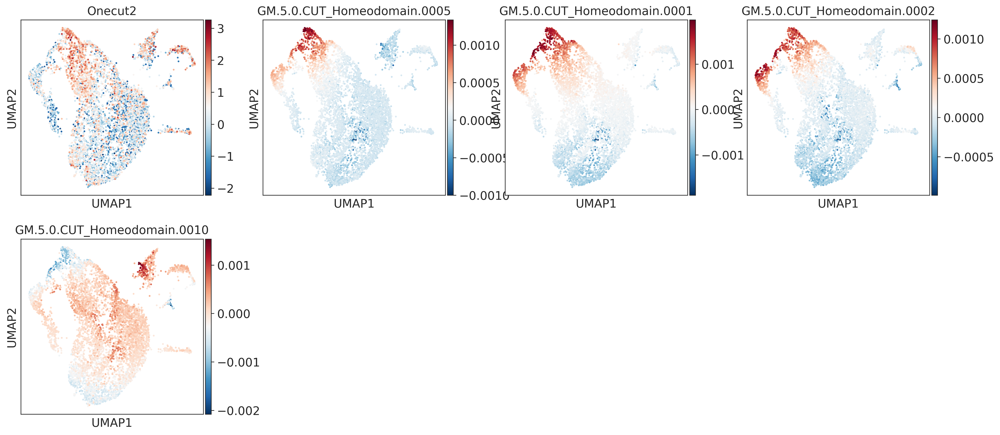

In [34]:
sc.pl.umap(adata, color=["Onecut2", "GM.5.0.CUT_Homeodomain.0005", 
                         "GM.5.0.CUT_Homeodomain.0001",
                         "GM.5.0.CUT_Homeodomain.0002", 
                         "GM.5.0.CUT_Homeodomain.0010"], cmap="RdBu_r")

In [35]:
f2m.loc["SPIB"].sort_values("p_adj").head(10)

,motif,correlation,abs_correlation,pval,permutation_pval,combined,p_adj,-log10(p-value),motif_stddev
factor,,,,,,,,,
SPIB,GM.5.0.Ets.0015,0.246861,0.246861,0.009870,0.057604,0.004817,0.079310,1.100674,0.003501
SPIB,GM.5.0.Ets.0010,0.230916,0.230916,0.012302,0.079428,0.007749,0.095553,1.019757,0.000435
SPIB,GM.5.0.Ets.0008,-0.178988,0.178988,0.025137,0.172899,0.027983,0.154632,0.810701,0.007192
SPIB,GM.5.0.Ets.0042,0.086422,0.086422,0.097062,0.360700,0.152369,0.307068,0.512766,0.005580


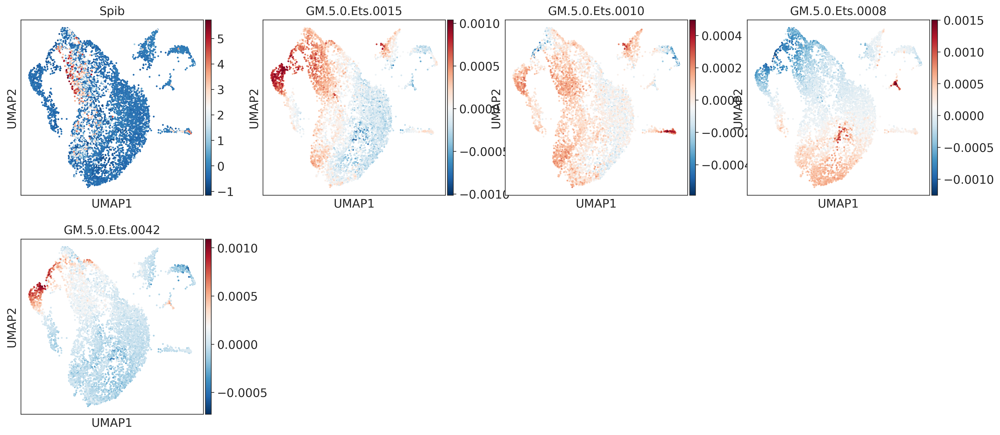

In [36]:
sc.pl.umap(adata, color=["Spib", "GM.5.0.Ets.0015", 
                         "GM.5.0.Ets.0010",
                         "GM.5.0.Ets.0008", 
                         "GM.5.0.Ets.0042"], cmap="RdBu_r")

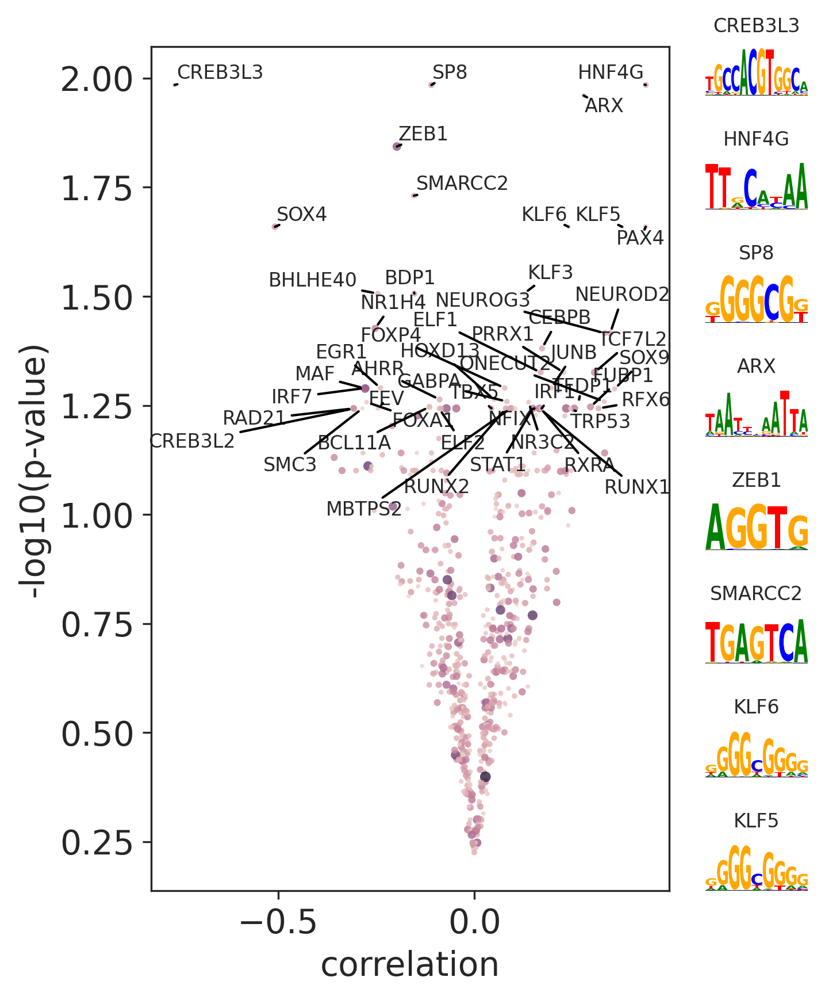

In [37]:
ax = plot(adata, n_anno=50, max_pval = 0.065)

In [38]:
adata.uns['scepia']["cell_types"] = list(adata.uns['scepia']["cell_types"])

## Subset correlation table on significant hits

In [39]:
## Run for the significant hits from SCEPIA, the top per cluster:
FDR = 0.1
#p_sig = 0.05

column_names = ['motif','motif_activity','factor','abs_correlation','correlation','p_adj']
#selected_columns = ['motif','correlation','pval','p_adj']
selected_columns = ['motif','correlation','abs_correlation','pval','p_adj']
cluster_top = pd.DataFrame()

# Make a table with the significant scepia results
tmp = adata.uns['scepia']['correlation'][selected_columns]
tmp = tmp.sort_values('p_adj')
tmp = tmp[tmp['p_adj'] <= FDR]
#tmp = tmp[tmp['pval'] <= p_sig]
tmp = tmp[~tmp.index.duplicated(keep='first')]
tmp['factor'] = tmp.index

# ! Consider sorting on abs_correlation and then selecting first of duplicates
tmp.head()

,motif,correlation,abs_correlation,pval,p_adj,factor
factor,,,,,,
CREB3L3,GM.5.0.bZIP.0041,-0.763459,0.763459,0.000033,0.010366,CREB3L3
HNF4G,GM.5.0.Nuclear_receptor.0068,0.436634,0.436634,0.000836,0.010366,HNF4G
SP8,GM.5.0.C2H2_ZF.0174,-0.109397,0.109397,0.068037,0.010366,SP8
ARX,GM.5.0.Homeodomain.0087,0.278578,0.278578,0.006328,0.010960,ARX
ZEB1,GM.5.0.C2H2_ZF_Homeodomain.0002,-0.197299,0.197299,0.019524,0.014345,ZEB1


In [40]:
## Generate cluster-mean motif/TF activity table:
cluster_activity = adata.obs.groupby('louvain').mean().T

# create a cluster_activity object with per cluster a motif activity and factor activity
# add motif_max column with the highest value per motif/TF
cluster_summary = cluster_activity.copy()
cluster_summary[['motif_max']] = cluster_activity.idxmax(axis = 1)
cluster_summary[['motif_min']] = cluster_activity.idxmin(axis = 1)

cluster_summary.head()

louvain,COI_1,COI_2,COI_3,motif_max,motif_min
GM.5.0.Sox.0001,-0.000343,0.000062,0.000052,COI_2,COI_1
GM.5.0.Homeodomain.0001,-0.000435,-0.000044,0.000140,COI_3,COI_1
GM.5.0.Mixed.0001,-0.000351,0.000051,0.000082,COI_3,COI_1
GM.5.0.Nuclear_receptor.0001,0.001024,-0.000240,-0.000150,COI_1,COI_2
GM.5.0.Mixed.0002,-0.000210,-0.000059,0.000056,COI_3,COI_1


### Selecting cluster-specific hits on absolute correlation

In [ ]:
sc.settings.figdir = work_dir
## Selecting the significant hits with a positive or negative correlation between motif and TF
pos_hits = tmp[tmp['correlation'] > 0]
pos_hits[['cluster_top']] = 'NA'
neg_hits = tmp[tmp['correlation'] < 0]
neg_hits[['cluster_top']] = 'NA'

# add cluster with maximum value for the motif, to the table
for i in pos_hits['motif']:
    pos_hits['cluster_top'][pos_hits['motif']==i] = cluster_summary[cluster_summary.index == i]['motif_max'][0]

# add cluster with minimum value for the motif, to the table
for i in neg_hits['motif']:
    neg_hits['cluster_top'][neg_hits['motif']==i] = cluster_summary[cluster_summary.index == i]['motif_min'][0]    

# .append(neg_hits) if both positive and negative hits should be included.
both_hits = pos_hits#.append(neg_hits)

# save a table per cluster with significant hits
cluster_sig = pd.DataFrame()
for i in both_hits['cluster_top'].unique():
    cluster_sig = both_hits[both_hits['cluster_top'] == i]
    cluster_sig = cluster_sig.sort_values('abs_correlation',ascending=False)
    cluster_sig.to_csv(work_dir + "PositiveSigMotifs_" + i + ".tsv", sep="\t")
    
    clust_top = cluster_sig.head(10)[["factor","motif"]]
    clust_top['factor'] = clust_top['factor'].str.capitalize()
    factor_motif = []
    for p in range(len(clust_top)):
        factor_motif = factor_motif + list(clust_top.iloc[p])
    
    sc.pl.umap(adata, color=factor_motif, cmap="RdYlBu_r", save="ClusterTop10_SigHits_Positive_"+i+".pdf", wspace = 0.5)
    